In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 691.5/691.5 kB 6.0 MB/s eta 0:00:00


# Install Yolov8

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display,Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 413, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose', 'obb')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at ht

# Train the Yolov8 model

### Download the Data

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="put your API KEY")
project = rf.workspace("deep-learing-p9dxb").project("detection-drowsiness")
dataset = project.version(1).download("yolov8")


# EDA

In [ ]:
%%capture
# data-gradients (suitable for performing EDA on complex image dataset)
!pip install data-gradients

# for displaying pdfs as images
!pip install pdf2image
!apt-get install poppler-utils

# for pretty printing json
!pip install Pygments

In [ ]:
from PIL import Image
from pdf2image import convert_from_path
from IPython.display import display

def display_pdf_pages (pdf_path):
    """
    Display each page of a PDF file as images in separate output cells.
    Args:
    pdf_path (str): The path to the PDF file.
    Raises:
    FileNotFoundError: If the specified PDF file is not found.
    Returns:
    None
    """
    try:
        # Convert PDF to a list of PIL Images
        images = convert_from_path(pdf_path)

        # Display each image
        for i, image in enumerate(images):
          # Display the image
          display(image)

    except FileNotFoundError:
        raise FileNotFoundError("The specified PDF file was not found.")

The print_pretty_json function opens a JSON file, formats the data with an indent of 4 spaces using json.dumps, applies syntax highlighting with Pygments, and prints the pretty-printed JSON data in the cell below.

In [ ]:
import json
from pygments import highlight, lexers, formatters
from pathlib import Path

def print_pretty_json(file_path):
    """
    Function to pretty print a JSON file with colorization.
    Args:
    file_path (Union[str, Path]): The path of the JSON file to be pretty-printed.
    Raises:
    FileNotFoundError: If the file at 'file_path doesn't exist.
    json.JSONDecodeError: If the file at 'file_path is not valid JSON.
    """
    try:
      # Open the file
      with open(file_path, 'r') as f:
        # Load the JSON data from the file
        data= json.load(f)
    except FileNotFoundError:
      raise FileNotFoundError (f"File not found: {file_path}")
    except json.JSONDecodeError:
      raise json.JSONDecodeError("Invalid JSON file", "", 0)

    # Pretty print the JSON data with an indent of 4 spaces
    formatted_json = json.dumps (data, indent=4)

    # Colorize the pretty-printed JSON data
    colorful_json = highlight(formatted_json,
                              lexers.JsonLexer(),
                              formatters.TerminalFormatter()
                              )
    # Print the colorized, pretty-printed JSON data
    print(colorful_json)

In [ ]:
import yaml

# define path to YAML file
yaml_file_path = '/content/detection-drowsiness--1/data.yaml'

# open the YAML file and load it into a dictionary
with open(yaml_file_path, 'r') as f:
  data_yaml = yaml.safe_load(f)

In [ ]:
# Instantiating Dataloaders
dataset_params = {
    'data_dir':'/content/detection-drowsiness--1',
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': ['awake', 'drowsy']
}

In [ ]:
from data_gradients.datasets.detection import YoloFormatDetectionDataset
train_set = YoloFormatDetectionDataset (root_dir="/content/detection-drowsiness--1",
                                        images_dir="train/images",
                                        labels_dir="train/labels")

val_set = YoloFormatDetectionDataset (root_dir="/content/detection-drowsiness--1",
                                      images_dir="valid/images",
                                      labels_dir="valid/labels")

In [ ]:
from data_gradients.managers.detection_manager import DetectionAnalysisManager
import matplotlib
matplotlib.use('Agg') # This line is only for Colab

analyzer = DetectionAnalysisManager(
    report_title="Testing Data-Gradients Object Detection",
    train_data=train_set,
    val_data=val_set,
    class_names=['awake', 'drowsy'],
)

analyzer.run()
# when running, input 0, then 0, then 1

  - Executing analysis with: 
  - batches_early_stop: None 
  - len(train_data): 1229 
  - len(val_data): 320 
  - log directory: /content/logs/Testing_Data-Gradients_Object_Detection 
  - Archive directory: /content/logs/Testing_Data-Gradients_Object_Detection/archive_20240107-133855 
  - feature extractor list: {'Image Features': [SummaryStats, ImagesResolution, ImageColorDistribution, ImagesAverageBrightness], 'Object Detection Features': [DetectionClassHeatmap, DetectionBoundingBoxArea, DetectionBoundingBoxPerImageCount, DetectionBoundingBoxSize, DetectionClassFrequency, DetectionClassesPerImageCount, DetectionBoundingBoxIoU, DetectionResizeImpact]}
╔══════════════════════════════════════════════════════════════════════════╗
║  To better understand how to tackle the data issues highlighted in this  ║
║  report, explore our comprehensive course on analyzing computer vision   ║
║  datasets. click here: https://hubs.ly/Q01XpHBT0                         ║
╚═════════════════════════════

Analyzing... :   0%|          | 0/1229 [00:00<?, ?it/s]


--------------------------------------------------------------------------------
In which format are your images loaded ?
--------------------------------------------------------------------------------

Options:
[0] | RGB
[1] | BGR
[2] | LAB
[3] | Other

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `RGB`

--------------------------------------------------------------------------------
Which comes first in your annotations, the class id or the bounding box?
--------------------------------------------------------------------------------
Here's a sample of how your labels look like:
Each line corresponds to a bounding box.
tensor([[1.0000, 0.5406, 0.5578, 0.2086, 0.4188]], dtype=torch.float64)
Options:
[0] | Label comes first (e.g. [class_id, x1, y1, x2, y2])
[1] | Bounding box comes first (e.g. [x1, y1, x2, y2, class_id])

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `Label comes first (e.g. [class_id, x1, y1, x2, y2])`

----------

Analyzing... :   0%|          | 3/1229 [00:15<1:24:03,  4.11s/it]

Great! You chose: `cxcywh: x-center, y-center, width, height		(YOLO format)`


Summarizing... : 100%|██████████| 2/2 [00:06<00:00,  3.41s/it]
You can find more information about what happened in /content/logs/Testing_Data-Gradients_Object_Detection/archive_20240107-133855/errors.json


Dataset successfully analyzed!
Starting to write the report, this may take around 10 seconds...

Your dataset evaluation has been completed!

----------------------------------------------------------------------------------------------------
Training Configuration...
`DetectionDataConfig` cache is not enabled because `cache_path=None` was not set.

----------------------------------------------------------------------------------------------------
Report Location:
    - Temporary Folder (will be overwritten next run):
        └─ /content/logs/Testing_Data-Gradients_Object_Detection
                ├─ Report.pdf
                └─ summary.json
    - Archive Folder:
        └─ /content/logs/Testing_Data-Gradients_Object_Detection/archive_20240107-133855
                ├─ Report.pdf
                └─ summary.json

Seen a glitch? Have a suggestion? Visit https://github.com/Deci-AI/data-gradients !


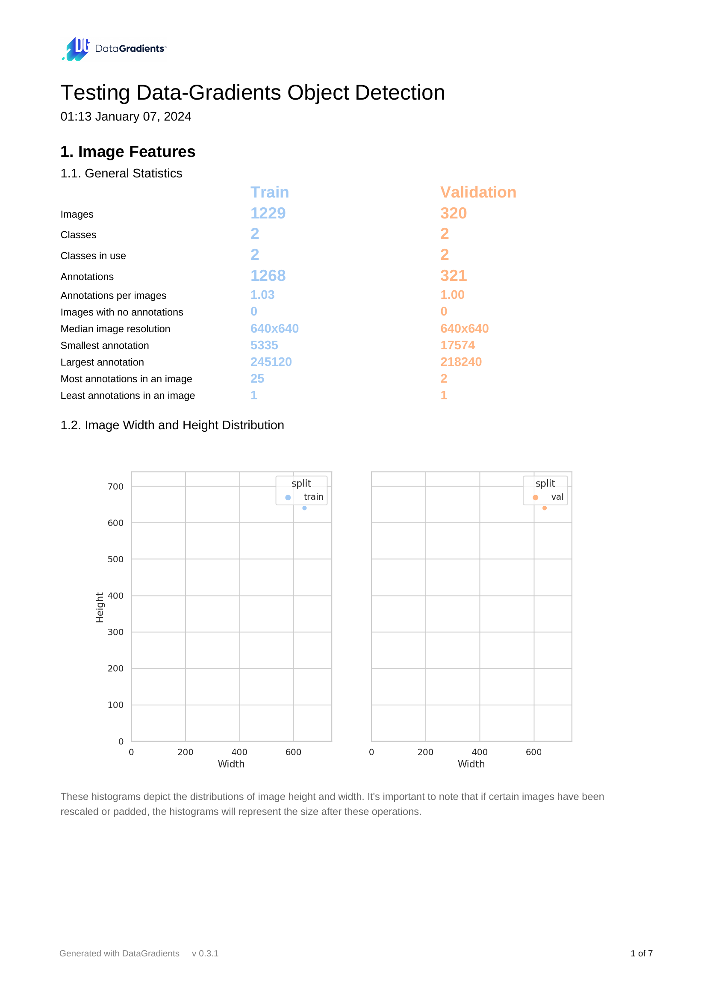

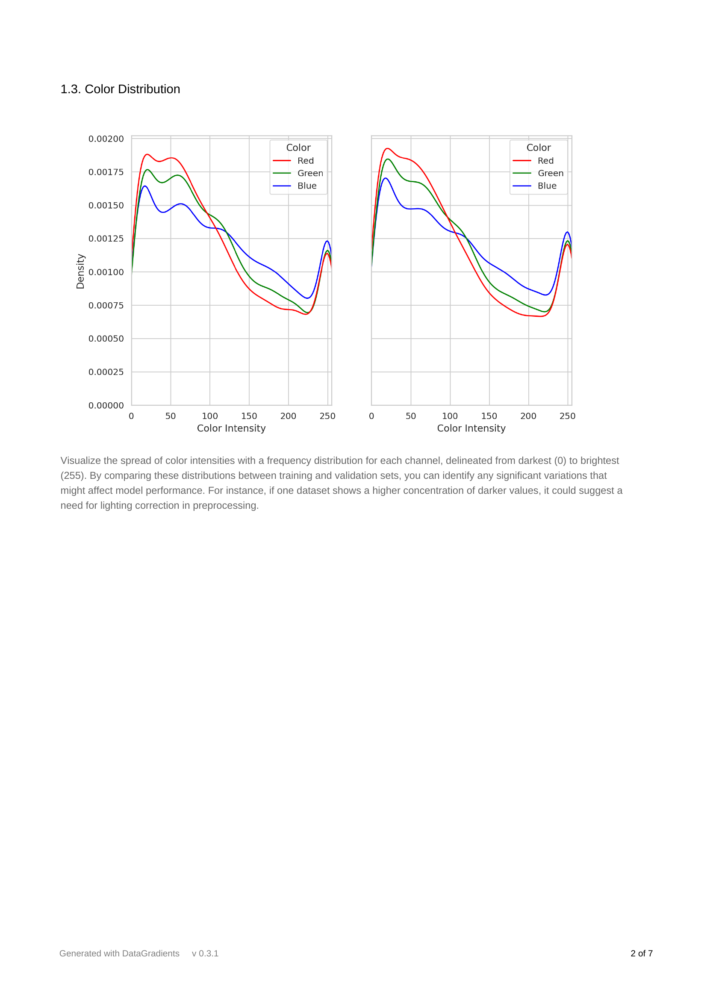

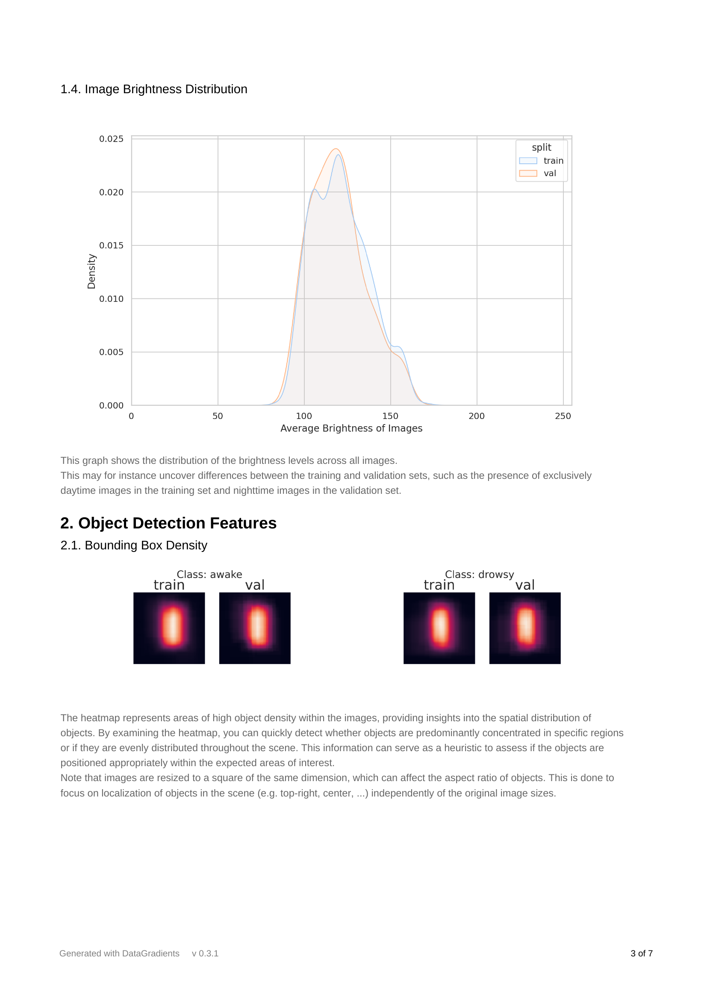

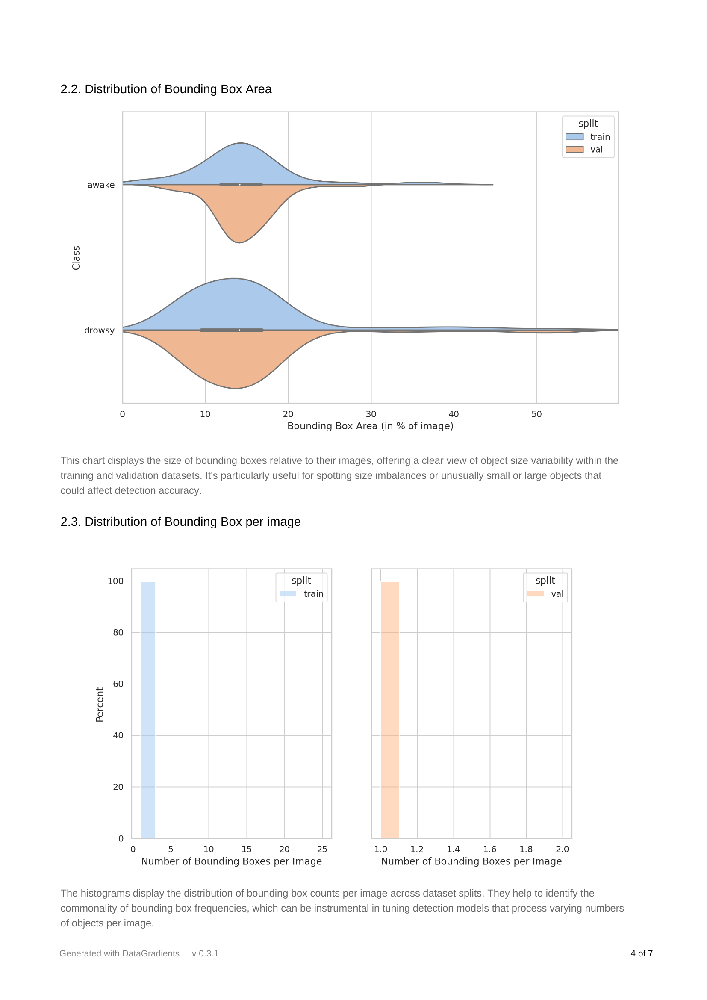

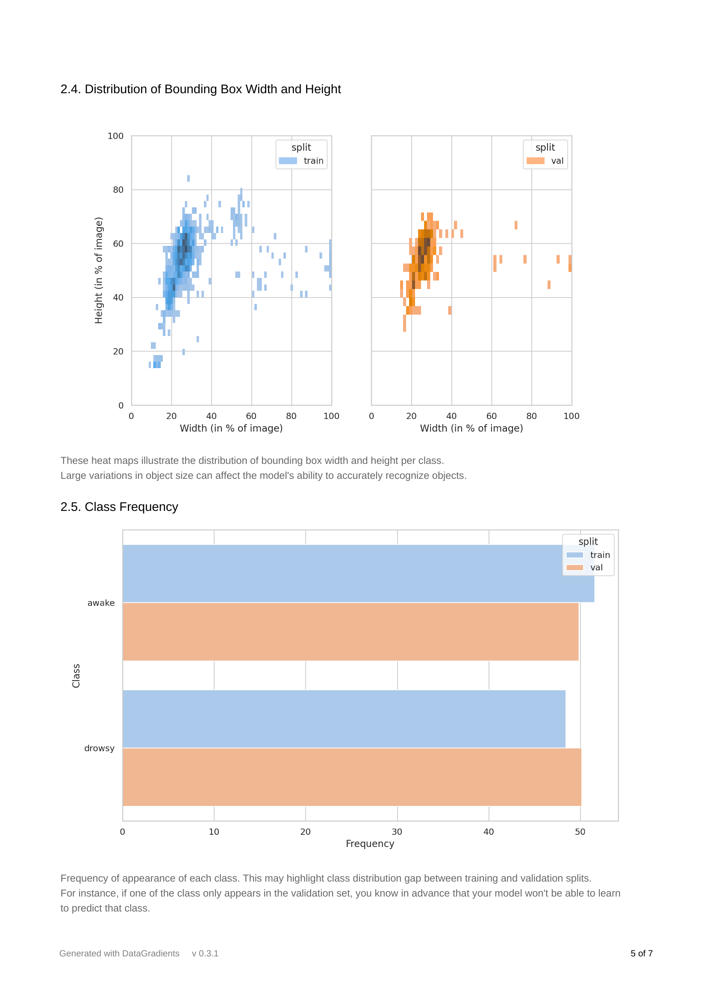

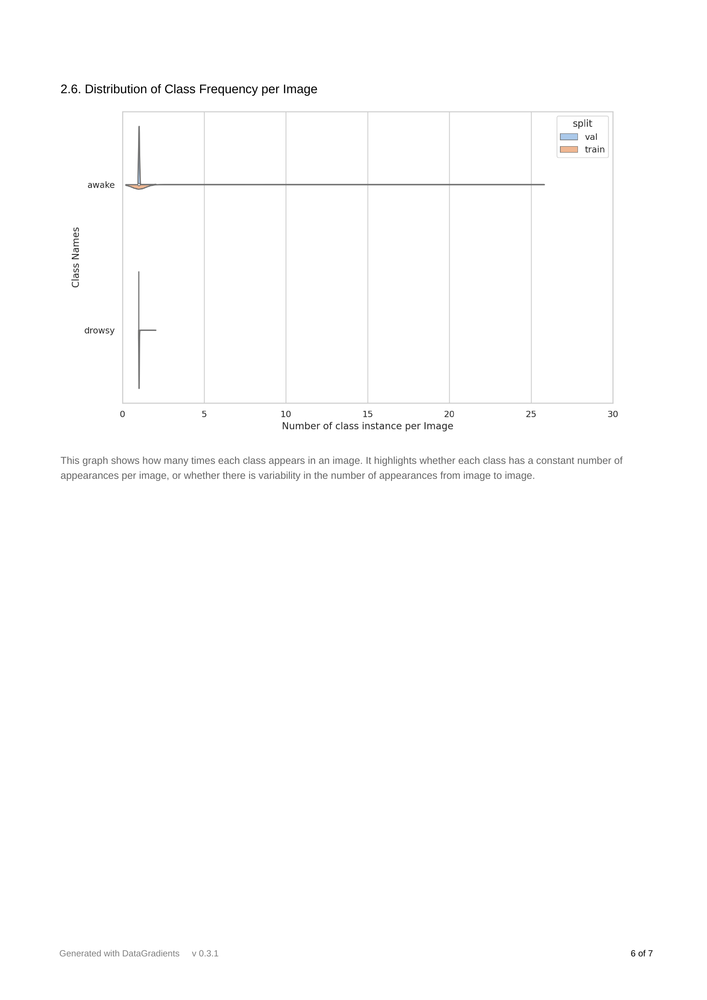

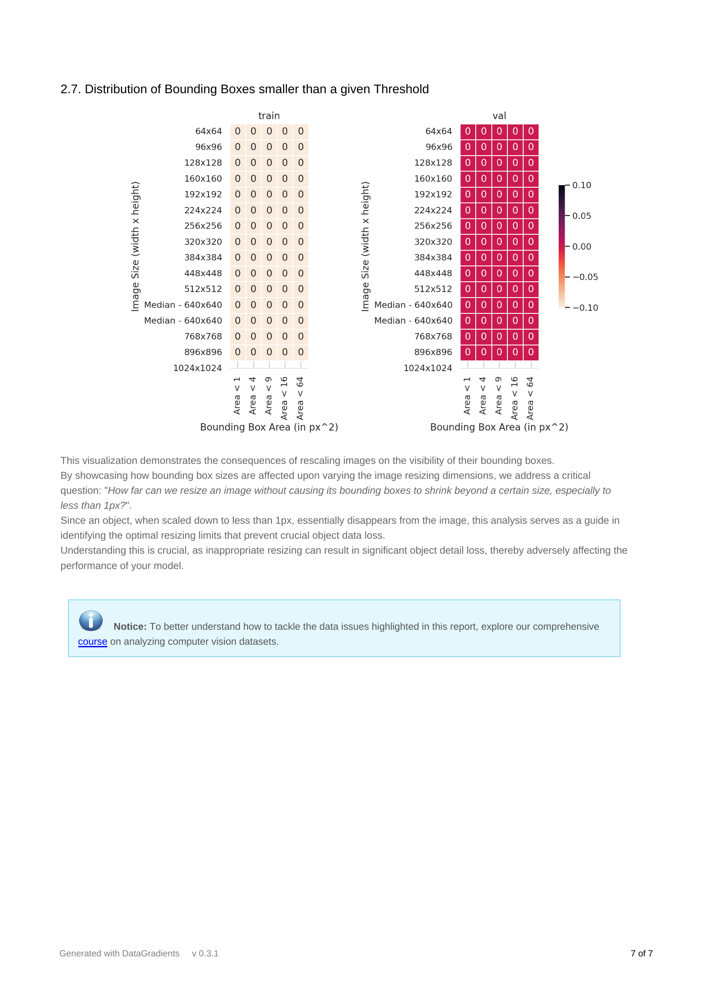

In [ ]:
display_pdf_pages("/content/logs/Testing_Data-Gradients_Object_Detection/Report.pdf")

In [ ]:
# Acessing report in json format
# report_json = '/content/logs/Testing_Data-Gradients_Object_Detection/summary.json'
# print_pretty_json(report_json)

In [ ]:
def run_detection_analysis(report_title,
                           feature_extractors,
                           train_data,
                           val_data,
                           class_names):

    # create an instance of DetectionAnalysisManager
    analyzer = DetectionAnalysisManager(
      report_title=report_title,
      feature_extractors = feature_extractors,
      train_data=train_data,
      val_data=val_data,
      class_names = class_names
    )

    # Run the analysis
    analyzer.run()

In [ ]:
run_detection_analysis(report_title= 'DetectionBoundingBoxPerImageCount',
                        feature_extractors = 'DetectionBoundingBoxPerImageCount',
                        train_data=train_set,
                        val_data=val_set,
                        class_names=['awake', 'drowsy'])

  - Executing analysis with: 
  - batches_early_stop: None 
  - len(train_data): 1229 
  - len(val_data): 320 
  - log directory: /content/logs/DetectionBoundingBoxPerImageCount 
  - Archive directory: /content/logs/DetectionBoundingBoxPerImageCount/archive_20240107-134139 
  - feature extractor list: {'Selected features': [DetectionBoundingBoxPerImageCount]}
╔══════════════════════════════════════════════════════════════════════════╗
║  To better understand how to tackle the data issues highlighted in this  ║
║  report, explore our comprehensive course on analyzing computer vision   ║
║  datasets. click here: https://hubs.ly/Q01XpHBT0                         ║
╚══════════════════════════════════════════════════════════════════════════╝


Analyzing... :   0%|          | 0/1229 [00:00<?, ?it/s]


--------------------------------------------------------------------------------
In which format are your images loaded ?
--------------------------------------------------------------------------------

Options:
[0] | RGB
[1] | BGR
[2] | LAB
[3] | Other

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `RGB`

--------------------------------------------------------------------------------
Which comes first in your annotations, the class id or the bounding box?
--------------------------------------------------------------------------------
Here's a sample of how your labels look like:
Each line corresponds to a bounding box.
tensor([[1.0000, 0.5406, 0.5578, 0.2086, 0.4188]], dtype=torch.float64)
Options:
[0] | Label comes first (e.g. [class_id, x1, y1, x2, y2])
[1] | Bounding box comes first (e.g. [x1, y1, x2, y2, class_id])

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `Label comes first (e.g. [class_id, x1, y1, x2, y2])`

----------

Analyzing... :   0%|          | 6/1229 [00:14<35:47,  1.76s/it]  

Great! You chose: `cxcywh: x-center, y-center, width, height		(YOLO format)`


Summarizing... : 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Dataset successfully analyzed!
Starting to write the report, this may take around 10 seconds...

Your dataset evaluation has been completed!

----------------------------------------------------------------------------------------------------
Training Configuration...
`DetectionDataConfig` cache is not enabled because `cache_path=None` was not set.

----------------------------------------------------------------------------------------------------
Report Location:
    - Temporary Folder (will be overwritten next run):
        └─ /content/logs/DetectionBoundingBoxPerImageCount
                ├─ Report.pdf
                └─ summary.json
    - Archive Folder:
        └─ /content/logs/DetectionBoundingBoxPerImageCount/archive_20240107-134139
                ├─ Report.pdf
                └─ summary.json

Seen a glitch? Have a suggestion? Visit https://github.com/Deci-AI/data-gradients !


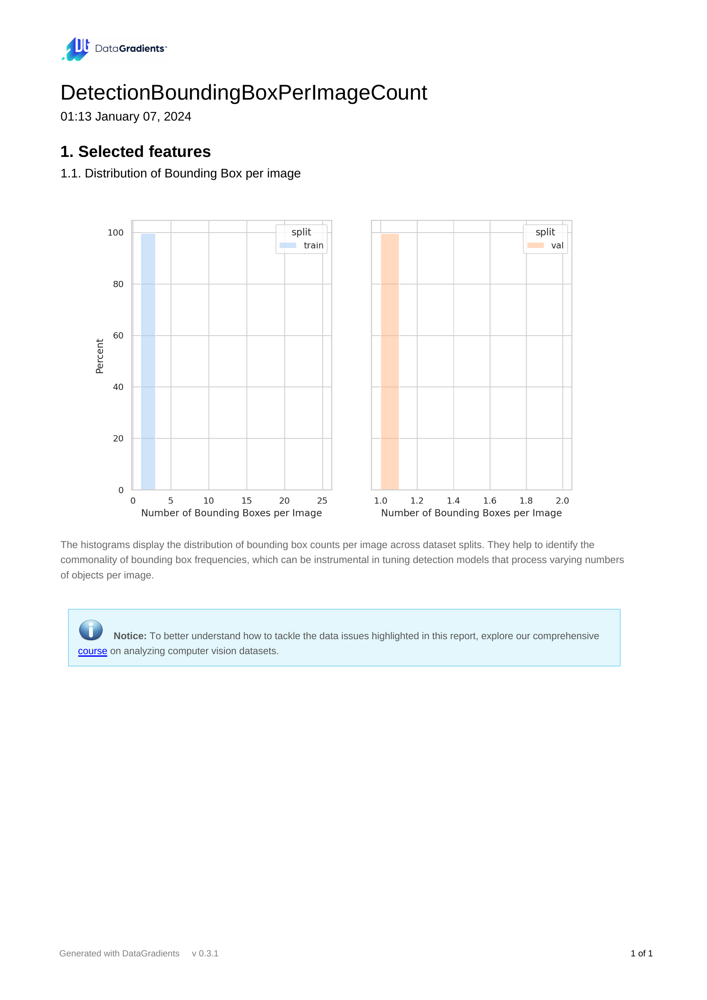

In [ ]:
display_pdf_pages('/content/logs/DetectionBoundingBoxPerImageCount/Report.pdf')

In [ ]:
report_json = '/content/logs/DetectionBoundingBoxPerImageCount/summary.json'
print_pretty_json(report_json)

{
    "metadata": {
        "__version__": "0.3.1",
        "report_title": "DetectionBoundingBoxPerImageCount",
        "report_subtitle": "01:13 January 07, 2024",
        "timestamp": "20240107-134139"
    },
    "data_config": {
        "images_extractor": "[0]",
        "labels_extractor": "[1]",
        "is_batch": false,
        "image_channels": "RGB",
        "n_classes": 2,
        "class_names": {
            "0": "awake",
            "1": "drowsy"
        },
        "class_names_to_use": [
            "awake",
            "drowsy"
        ],
        "is_label_first": true,
        "xyxy_converter": "cxcywh"
    },
    "errors": [],
    "features": [
        {
            "title": "DetectionBoundingBoxPerImageCount",
            "stats": {
                "train": {
                    "count": 1229.0,
                    "mean": 1.03173311635476,
                    "std": 0.7206597640290192,
                    "min": 1.0,
                    "25%": 1.0,
                  

# The model

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs =15 imgsz = 640

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/detection-drowsiness--1/data.yaml, epochs=15, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sho

In [ ]:
Image(filename =f'/content/runs/detect/train/confusion_matrix.png', width = 600)

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/train/confusion_matrix.png'

In [ ]:
Image(filename= f'/content/runs/detect/train/results.png')

FileNotFoundError: [Errno 2] No such file or directory: '/content/runs/detect/train/results.png'

In [ ]:
!yolo task= detect mode=val model= /content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 466, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 291, in val
    validator(model=self.model)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py", line 139, in __call__
    self.data = check_det_dataset(self.args.data)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/data/utils.py", line 312, in check_det_dataset
    raise FileNotFoundEr

# The results

In [ ]:
!yolo task= detect mode=val model= /content/runs/detect/train/weights/best.pt data={dataset.location}/test.yaml

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 466, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 291, in val
    validator(model=self.model)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py", line 139, in __call__
    self.data = check_det_dataset(self.args.data)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/data/utils.py", line 253, in check_det_dataset
    file = check_file(da

# show the test sample results

In [ ]:
!yolo task=detect mode= predict model= /content/runs/detect/train/weights/best.pt conf=0.5 source ={dataset.location}/test/images

Ultralytics YOLOv8.0.236 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/160 /content/detection-drowsiness--1/test/images/1004_jpg.rf.3764fa3b3875cb406f50de817b71f69d.jpg: 640x640 1 awake, 16.3ms
image 2/160 /content/detection-drowsiness--1/test/images/1028_jpg.rf.570c38b72ef3490e6e2c54dfe5042e46.jpg: 640x640 1 awake, 16.3ms
image 3/160 /content/detection-drowsiness--1/test/images/1039_jpg.rf.0655fcab6a2e6f15ee24e2823a158e2f.jpg: 640x640 1 awake, 16.3ms
image 4/160 /content/detection-drowsiness--1/test/images/103_jpg.rf.5192a6088e7aca20cd1cdb8d05c9ec34.jpg: 640x640 1 drowsy, 16.3ms
image 5/160 /content/detection-drowsiness--1/test/images/1046_jpg.rf.babcc663732579317c5ab0586d73e6d5.jpg: 640x640 1 awake, 16.3ms
image 6/160 /content/detection-drowsiness--1/test/images/1047_jpg.rf.78e96f973517d5c78afb5408eea47db5.jpg: 640x640 1 awake, 16.3ms
im

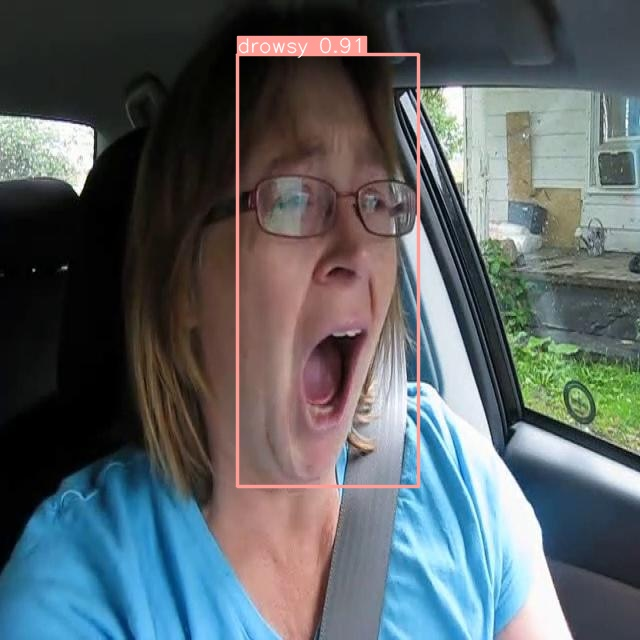

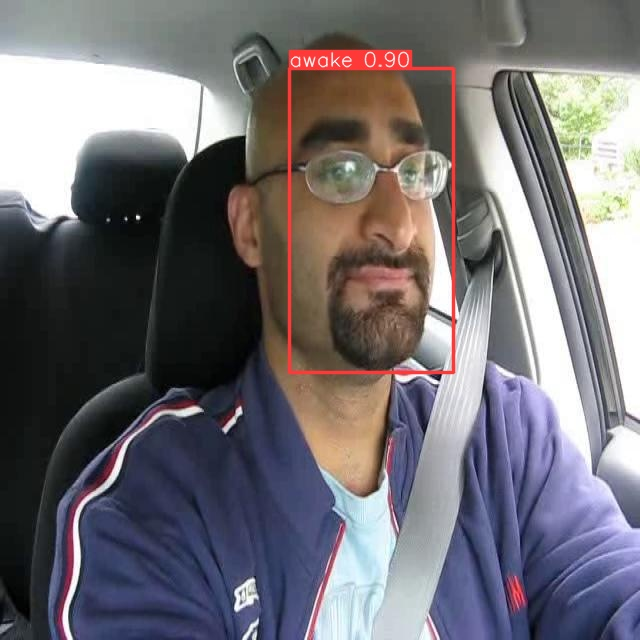

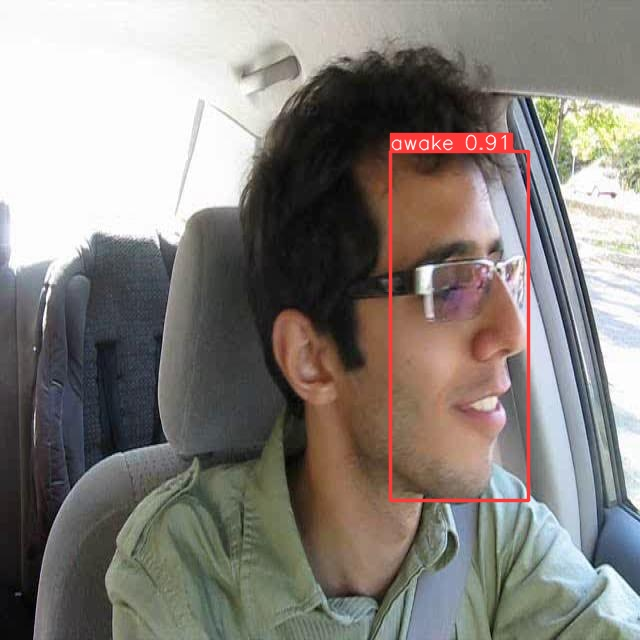

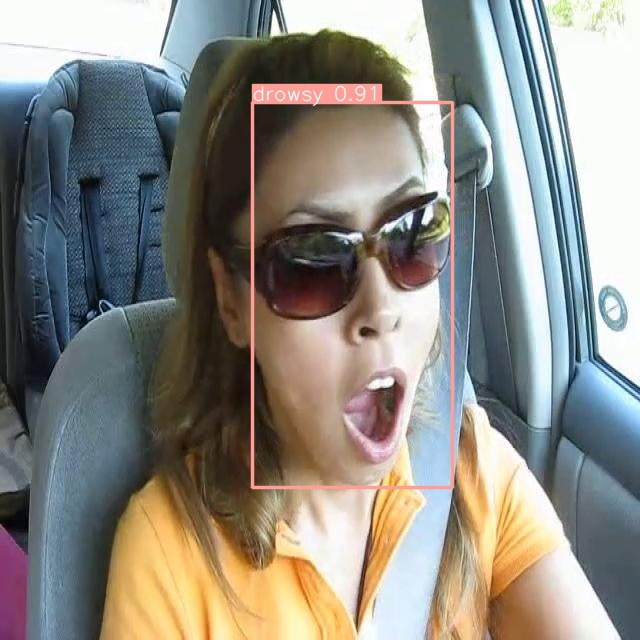

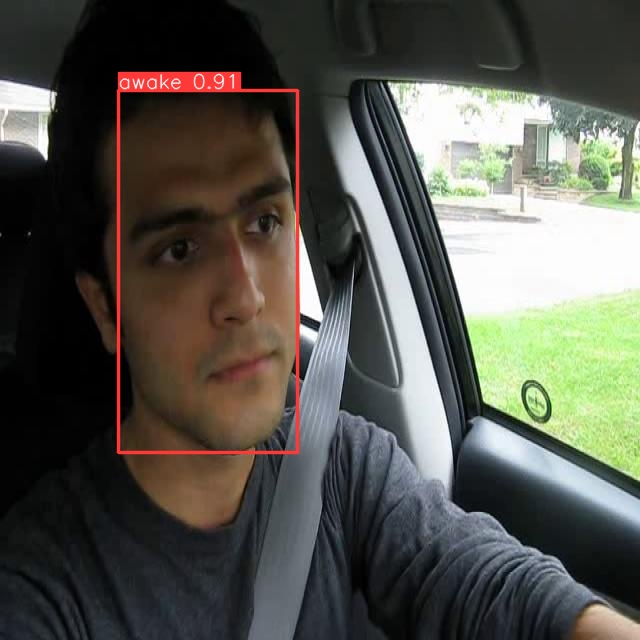

...

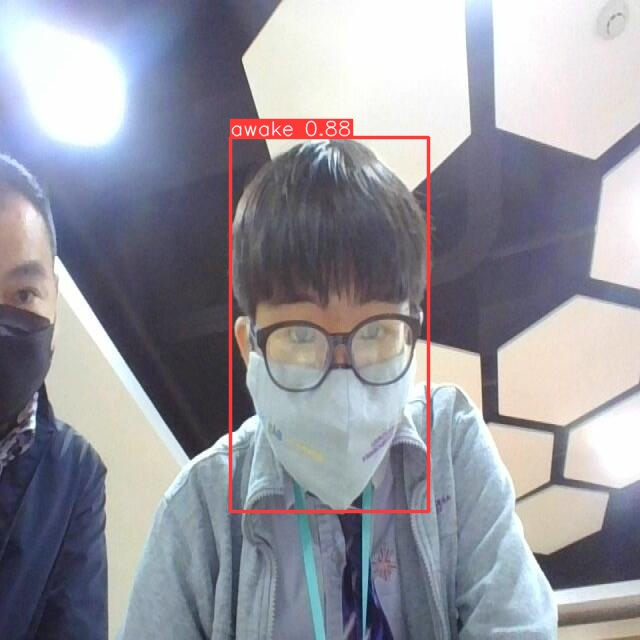

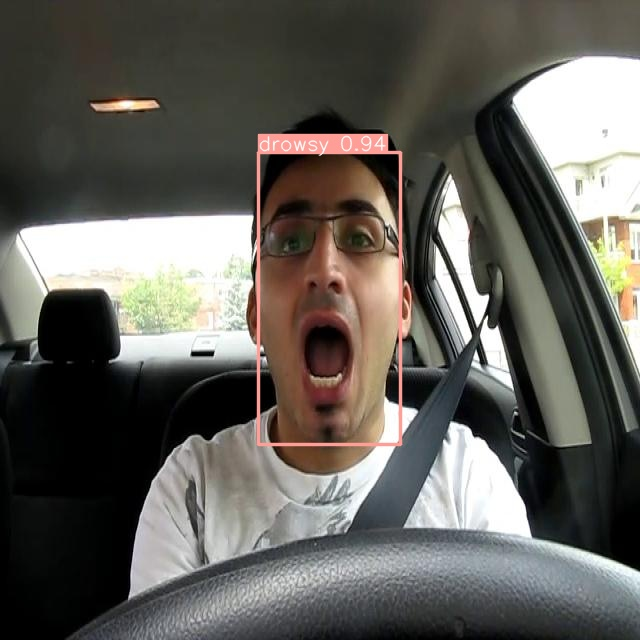

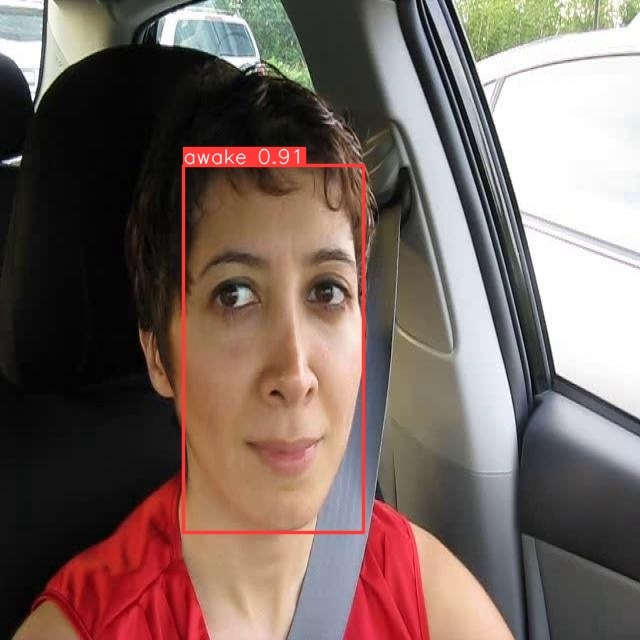

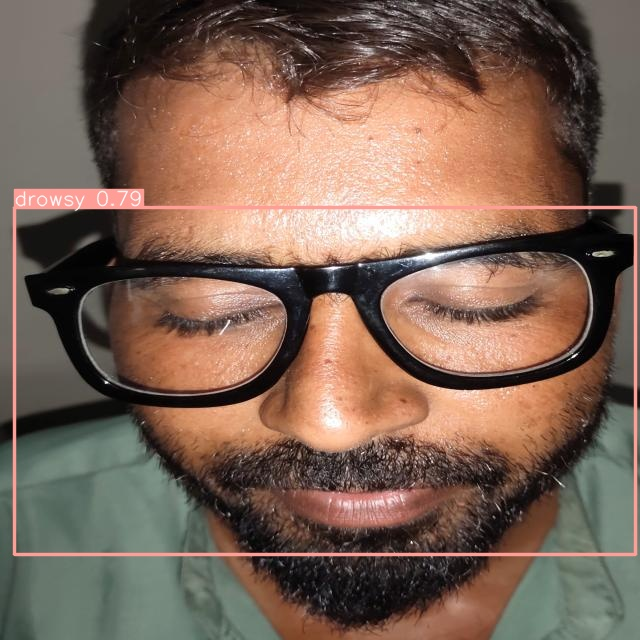

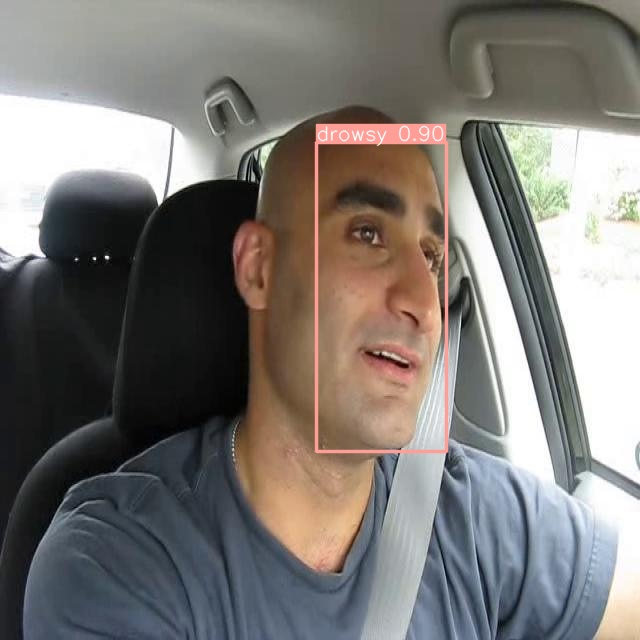

In [ ]:
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename= image_path ,height = 600))
  print("\n")


In [ ]:
import torch
import numpy as np
import cv2
from time import time
from ultralytics import YOLO
import matplotlib.pyplot as plt
import supervision as sv


class ObjectDetection:

    def __init__(self, capture_index):

        self.capture_index = capture_index
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        print("Using Device: ", self.device)
        self.model = self.load_model()
        self.CLASS_NAMES_DICT = self.model.model.names
        self.box_annotator = sv.BoxAnnotator(sv.ColorPalette.default(), thickness=3, text_thickness=3, text_scale=1.5)

    def load_model(self):

        model = YOLO("best.pt")  # load a pretrained YOLOv8n model
        model.fuse()

        return model

    def predict(self, frame):

        results = self.model(frame)

        return results

    def plot_bboxes(self, results, frame):

        xyxys = []
        confidences = []
        class_ids = []

        # Extract detections for person class
        for result in results:
            boxes = result.boxes.cpu().numpy()
            if len(boxes) > 0:
                class_id = boxes.cls[0]
                conf = boxes.conf[0]
                xyxy = boxes.xyxy[0]

                if class_id == 0.0:
                    xyxys.append(result.boxes.xyxy.cpu().numpy())
                    confidences.append(result.boxes.conf.cpu().numpy())
                    class_ids.append(result.boxes.cls.cpu().numpy().astype(int))

        # Setup detections for visualization
        detections = sv.Detections(
            xyxy=results[0].boxes.xyxy.cpu().numpy(),
            confidence=results[0].boxes.conf.cpu().numpy(),
            class_id=results[0].boxes.cls.cpu().numpy().astype(int),
        )

        # Assuming detections.xyxy, detections.confidence, detections.class_id, and detections.tracker_id are numpy arrays/lists or None
        xyxy = detections.xyxy if detections.xyxy is not None else []
        confidence = detections.confidence if detections.confidence is not None else []
        class_id = detections.class_id if detections.class_id is not None else []
        tracker_id = detections.tracker_id if detections.tracker_id is not None else []

        self.labels = [f"{self.CLASS_NAMES_DICT[class_id]} {conf.item():0.2f}"
                       for xy, conf, class_id, tracker_id in zip(xyxy, confidence, class_id, tracker_id)]

        # Annotate and display frame
        frame = self.box_annotator.annotate(scene=frame, detections=detections, labels=self.labels)

        return frame

    def __call__(self):
        cap = cv2.VideoCapture(self.capture_index)
        assert cap.isOpened()
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 720)

        while True:
            start_time = time()

            ret, frame = cap.read()
            if not ret:  # Check if the frame was read successfully
                break  # Break the loop if there are no more frames

            results = self.predict(frame)
            frame = self.plot_bboxes(results, frame)

            end_time = time()
            fps = 1 / np.round(end_time - start_time, 2)

            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.title(f'YOLOv8 Detection - FPS: {int(fps)}')
            plt.axis('off')
            plt.pause(0.001)

        cap.release()
        plt.close()

# Create an instance of ObjectDetection
detector = ObjectDetection(capture_index=1)

# print(cv2.VideoCapture(0).isOpened())
# Run the object detection loop
detector()


Using Device:  cuda


FileNotFoundError: [Errno 2] No such file or directory: 'best.pt'